# Milestone Project 1 : Food Vision

See the version of this notebook on GitHub referring my teacher :  
https://github.com/mrdbourke/tensorflow-deep-learning/blob/main/extras/TEMPLATE_07_food_vision_milestone_project_1.ipynb

Check GPU

In [6]:
!nvidia-smi

Fri May 29 17:09:01 2026       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 580.82.07              Driver Version: 580.82.07      CUDA Version: 13.0     |
+-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   44C    P8             10W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

https://www.tensorflow.org/guide/mixed_precision?hl=tr

Tesla T4 Compute Capability Point : 7.5  
It's enough for me.  
You can buy `100 Processing Unit`.It's cheap.  

https://developer.nvidia.com/cuda/gpus

## Get helper functions

Rather than rewrite some functions, we can import a script and load them from there.  


In [7]:
!wget https://raw.githubusercontent.com/mrdbourke/tensorflow-deep-learning/refs/heads/main/extras/helper_functions.py


--2026-05-29 17:09:02--  https://raw.githubusercontent.com/mrdbourke/tensorflow-deep-learning/refs/heads/main/extras/helper_functions.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 10246 (10K) [text/plain]
Saving to: ‘helper_functions.py’

helper_functions.py 100%[===================>]  10.01K  --.-KB/s    in 0s      

2026-05-29 17:09:02 (19.9 MB/s) - ‘helper_functions.py’ saved [10246/10246]



In [8]:
from helper_functions import create_tensorboard_callback, plot_loss_curves, compare_historys

## For Security Connect to Drive

In [9]:
from google.colab import drive
drive.mount("/content/drive")

import os

PROJECT_DIR = "/content/drive/MyDrive/food101_milestone"
CHECKPOINT_DIR = PROJECT_DIR + "/checkpoints"
MODEL_DIR = PROJECT_DIR + "/models"
LOG_DIR = PROJECT_DIR + "/logs"

os.makedirs(CHECKPOINT_DIR, exist_ok=True)
os.makedirs(MODEL_DIR, exist_ok=True)
os.makedirs(LOG_DIR, exist_ok=True)

Mounted at /content/drive


## Use TensorFlow Datasets to download data

https://www.tensorflow.org/datasets?hl=tr

https://www.tensorflow.org/datasets/catalog/overview?hl=tr#all_datasets

This provides us to download in Tensor format.Ready to modelling.

In [10]:
import tensorflow_datasets as tfds

In [11]:
datasets_list = tfds.list_builders() # get all avaible datasets in TFDS
print("food101" in datasets_list) # is our target dataset in the list?

True


In [12]:
# Load in the data (takes 5-6 minutes in Google Colab) file is 5 gb i guess.
(train_data, test_data), ds_info = tfds.load(name="food101",
                                             split=["train", "validation"],
                                             shuffle_files=True,
                                             as_supervised=True, # data gets returned in tuple (data, label)
                                             with_info=True)

Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Extraction completed...: 0 file [00:00, ? file/s]

Generating splits...:   0%|          | 0/2 [00:00<?, ? splits/s]

Generating train examples...: 0 examples [00:00, ? examples/s]

Shuffling /root/tensorflow_datasets/food101/incomplete.223VHD_2.0.0/food101-train.tfrecord-[0-9][0-9][0-9][0-9…

Generating validation examples...: 0 examples [00:00, ? examples/s]

Shuffling /root/tensorflow_datasets/food101/incomplete.223VHD_2.0.0/food101-validation.tfrecord-[0-9][0-9][0-9…

Dataset food101 downloaded and prepared to /root/tensorflow_datasets/food101/2.0.0. Subsequent calls will reuse this data.


In [13]:
# Features of Food101 from TFDS
ds_info.features

FeaturesDict({
    'image': Image(shape=(None, None, 3), dtype=uint8),
    'label': ClassLabel(shape=(), dtype=int64, num_classes=101),
})

In [14]:
# Get the class names
class_names = ds_info.features["label"].names
class_names[:10]

['apple_pie',
 'baby_back_ribs',
 'baklava',
 'beef_carpaccio',
 'beef_tartare',
 'beet_salad',
 'beignets',
 'bibimbap',
 'bread_pudding',
 'breakfast_burrito']

In [15]:
train_data

<_PrefetchDataset element_spec=(TensorSpec(shape=(None, None, 3), dtype=tf.uint8, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>

In [16]:
# Take one sample of the train data
train_data_one_sample = train_data.take(1) # samples are in format (image_tensor, label)
# What does one sample of our training data look like?
train_data_one_sample

<_TakeDataset element_spec=(TensorSpec(shape=(None, None, 3), dtype=tf.uint8, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>

In [17]:
# Output info about our training sample
for image, label in train_data_one_sample:
  print(f"""
  Image shape: {image.shape}
  Image dtype: {image.dtype}
  Target class from Food101: {label}
  Class name (from Food101 metadata): {class_names[label]}
  """)


  Image shape: (384, 512, 3)
  Image dtype: <dtype: 'uint8'>
  Target class from Food101: 70
  Class name (from Food101 metadata): pad_thai
  


In [18]:
# What does our image tensor from TFDS's Food101 look like?
image

<tf.Tensor: shape=(384, 512, 3), dtype=uint8, numpy=
array([[[230, 229, 183],
        [231, 230, 184],
        [232, 231, 183],
        ...,
        [232, 233, 202],
        [229, 234, 204],
        [229, 236, 205]],

       [[228, 227, 179],
        [227, 226, 178],
        [226, 226, 176],
        ...,
        [234, 235, 204],
        [232, 237, 207],
        [234, 241, 210]],

       [[229, 229, 175],
        [229, 229, 175],
        [227, 227, 175],
        ...,
        [233, 234, 202],
        [232, 237, 205],
        [235, 242, 209]],

       ...,

       [[119,  97,  58],
        [131, 109,  70],
        [131, 109,  70],
        ...,
        [239, 241, 220],
        [238, 240, 219],
        [238, 240, 219]],

       [[120,  98,  61],
        [133, 111,  74],
        [135, 113,  76],
        ...,
        [240, 242, 221],
        [240, 242, 221],
        [240, 242, 221]],

       [[136, 114,  77],
        [135, 113,  76],
        [129, 107,  70],
        ...,
        [243, 245, 22

In [19]:
import tensorflow as tf

In [20]:
tf.reduce_min(image), tf.reduce_max(image)

(<tf.Tensor: shape=(), dtype=uint8, numpy=0>,
 <tf.Tensor: shape=(), dtype=uint8, numpy=255>)

## Plot an image from TensorFlow Datasets

(np.float64(-0.5), np.float64(511.5), np.float64(383.5), np.float64(-0.5))

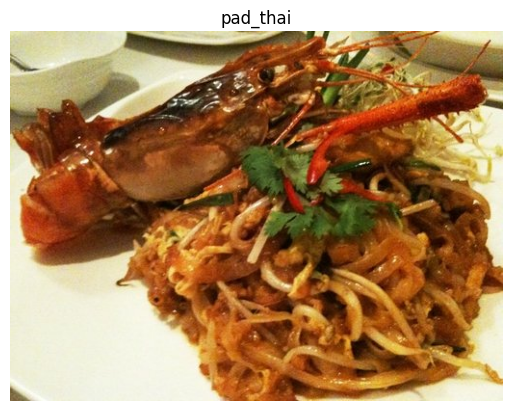

In [21]:
# Plot an image tensor
import matplotlib.pyplot as plt
plt.imshow(image)
plt.title(class_names[label.numpy()])
plt.axis(False)

## Create preprocessing functions for our data

neural networks perform best when data is in a certain way (e.g. batched, normalized etc.)  

⚓ What we know about our data:  
* In `uint8` datatype
* Comprised of all different size tensors
* Not scaled (0-255 now)

What we know models like:  
* Data in `float32` dtype (or for mixed precision `float32` and `float16`).  
* For batches, TensorFlow likes all of the tensors within a batch to be of the same size.  
* Scaled (values between 0 & 1) normalization.  

With these points in mind, we've got a few things we can tackle with a preprocessing function.  

If you'll use pre-trained models like efficientnet etc. you don't need to normalize.  

This means our functions needs to:  
1. Reshape our images to all the same size.  
2. Convert the dtype of our image tensors from `unit8` to `float32`.  




In [22]:
# Make a function for preprocessing images
def preprocessing_img(image, label, img_shape=224): #target shape depends to you.
  """
  Converts image data type from 'uint8' -> 'float32'
  Reshapes image to [img_shape, img_shape, color_channels]
  """
  image = tf.image.resize(image, [img_shape, img_shape])
  #image = image / 255. # no need for efficientnetbx
  return tf.cast(image, tf.float32), label


In [23]:
# Preprocess a single sample image and check the outputs
preprocessed_img = preprocessing_img(image, label)[0]
print(f"Image before preprocessing:\n {image[:2], image.shape, image.dtype}\n")
print(f"Image after preprocessing:\n {preprocessed_img[:2], preprocessed_img.shape, preprocessed_img.dtype}")

Image before preprocessing:
 (<tf.Tensor: shape=(2, 512, 3), dtype=uint8, numpy=
array([[[230, 229, 183],
        [231, 230, 184],
        [232, 231, 183],
        ...,
        [232, 233, 202],
        [229, 234, 204],
        [229, 236, 205]],

       [[228, 227, 179],
        [227, 226, 178],
        [226, 226, 176],
        ...,
        [234, 235, 204],
        [232, 237, 207],
        [234, 241, 210]]], dtype=uint8)>, TensorShape([384, 512, 3]), tf.uint8)

Image after preprocessing:
 (<tf.Tensor: shape=(2, 224, 3), dtype=float32, numpy=
array([[[229.46939, 228.46939, 181.7551 ],
        [229.59184, 228.94897, 180.2347 ],
        [224.14796, 224.14796, 171.71939],
        ...,
        [238.21933, 231.07143, 200.37251],
        [237.02545, 233.38266, 204.23978],
        [230.32655, 236.04091, 205.68373]],

       [[228.80103, 228.87245, 174.58673],
        [225.95409, 225.95918, 173.80103],
        [226.64795, 226.64795, 174.21939],
        ...,
        [238.41322, 232.41322, 199.954

### Batch & Prepare Datasets

We're now going to make our data input pipeline run really fast.  

For more recourses :  

https://www.tensorflow.org/guide/data_performance?hl=tr



In [24]:
train_data

<_PrefetchDataset element_spec=(TensorSpec(shape=(None, None, 3), dtype=tf.uint8, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>

In [25]:
# Map preprocessing function to training (and parallelize)
train_data = train_data.map(map_func=preprocessing_img, num_parallel_calls=tf.data.AUTOTUNE)
# Shuffle train_data and turn it into batches and prefetch it (load it faster)
train_data = train_data.shuffle(buffer_size=1000).batch(batch_size=32).prefetch(buffer_size=tf.data.AUTOTUNE)

# Map preprocessing function to test data
test_data = test_data.map(map_func=preprocessing_img, num_parallel_calls=tf.data.AUTOTUNE).batch(32).prefetch(tf.data.AUTOTUNE)

1. `map()` applies the preprocessing function to every `(image, label)` pair in the dataset.
   In this case, it resizes each image to `224x224` and converts the image data type from `uint8` to `float32`.

2. `num_parallel_calls=tf.data.AUTOTUNE` allows TensorFlow to process multiple images in parallel.
   TensorFlow automatically chooses the best number of parallel calls depending on the available system resources.

3. `shuffle(buffer_size=1000)` randomly shuffles the training data.
   This helps the model see mixed examples instead of learning from images in a fixed or grouped order.

4. `batch(batch_size=32)` groups the images into batches of 32.
   Instead of sending one image at a time to the model, TensorFlow sends 32 images together.

5. After batching, the image shape becomes something like `(32, 224, 224, 3)`.
   This means: 32 images, each image is 224 pixels high, 224 pixels wide, and has 3 color channels: Red, Green, and Blue.

6. `prefetch(tf.data.AUTOTUNE)` prepares the next batch while the model is training on the current batch.
   This helps reduce waiting time and keeps the GPU/CPU pipeline faster.

7. The training pipeline usually looks like this:
   raw images → preprocessing → shuffle → batch → prefetch → model training

8. The test pipeline usually does not use `shuffle()`.
   Test data is only preprocessed, batched, and prefetched because we usually do not need to randomize it.


In [26]:
train_data, test_data

(<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int64, name=None))>,
 <_PrefetchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int64, name=None))>)

## Creating modelling callbacks  

We're going to create a couple of callbacks to help us while our model trains:

* TensorBoard callback to log training results (so we can visualize them if need be)  
* ModelCheckpoint callback to save our model's progress after feature extraction.  


In [27]:
# Create tensorboard callback (import from healper_functions.py)
from helper_functions import create_tensorboard_callback

In [28]:
# Create ModelCheckpoint callback to save model's progress during training
feature_checkpoint_path = CHECKPOINT_DIR + "/feature_extract_best.weights.h5"

model_checkpoint = tf.keras.callbacks.ModelCheckpoint(
    filepath=feature_checkpoint_path,
    monitor="val_accuracy",
    save_best_only=True,
    save_weights_only=True,
    verbose=0
)

## Setup mixed precision training

First and foremost, for a deeper understanding, check out the TensorFlow document.  

https://www.tensorflow.org/guide/mixed_precision?hl=tr  

Mixed precision utilizes a combination of float32 and float16 data types to speed up model performance.  


In [29]:
from tensorflow.keras import mixed_precision
mixed_precision.set_global_policy("mixed_float16")

In [30]:
mixed_precision.global_policy()

<DTypePolicy "mixed_float16">

## Build Feature Extraction Model

In [31]:
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential

In [32]:
len(class_names)

101

In [33]:
# Create base model
input_shape = (224, 224, 3)
base_model = tf.keras.applications.EfficientNetB0(include_top=False)
base_model.trainable = False

# Create functional model
inputs = layers.Input(shape=input_shape)
# x = preprocessing.Rescale(1./255)(x) # if our model wouldn't be EfficientNetB0
x = base_model(inputs, training=False)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dense(len(class_names))(x)
outputs = layers.Activation("softmax", dtype=tf.float32, name="softmax_float32")(x)

model = tf.keras.Model(inputs, outputs)

16705208/16705208 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [34]:
# Compile
model.compile(loss="sparse_categorical_crossentropy",
              optimizer=tf.keras.optimizers.Adam(),
              metrics=["accuracy"])


In [35]:
base_model.summary()

Model: "efficientnetb0"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, None,      │          0 │ -                 │
│ (InputLayer)        │ None, 3)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling           │ (None, None,      │          0 │ input_layer[0][0] │
│ (Rescaling)         │ None, 3)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ normalization       │ (None, None,      │          7 │ rescaling[0][0]   │
│ (Normalization)     │ None, 3)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling_1         │ (None, None,      │          0 │ normalization[0]… │
│ (Rescaling)         │ None, 3)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv_pad       │ (None, None,      │          0 │ rescaling_1[0][0] │
│ (ZeroPadding2D)     │ None, 3)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv (Conv2D)  │ (None, None,      │        864 │ stem_conv_pad[0]… │
│                     │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn             │ (None, None,      │        128 │ stem_conv[0][0]   │
│ (BatchNormalizatio… │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_activation     │ (None, None,      │          0 │ stem_bn[0][0]     │
│ (Activation)        │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_dwconv      │ (None, None,      │        288 │ stem_activation[… │
│ (DepthwiseConv2D)   │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_bn          │ (None, None,      │        128 │ block1a_dwconv[0… │
│ (BatchNormalizatio… │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_activation  │ (None, None,      │          0 │ block1a_bn[0][0]  │
│ (Activation)        │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_squeeze  │ (None, 32)        │          0 │ block1a_activati… │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_reshape  │ (None, 1, 1, 32)  │          0 │ block1a_se_squee… │
│ (Reshape)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_reduce   │ (None, 1, 1, 8)   │        264 │ block1a_se_resha… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_expand   │ (None, 1, 1, 32)  │        288 │ block1a_se_reduc… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_excite   │ (None, None,      │          0 │ block1a_activati… │
│ (Multiply)          │ None, 32)         │            │ block1a_se_expan… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_co… │ (None, None,      │        512 │ block1a_se_excit

 Total params: 4,049,571 (15.45 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 4,049,571 (15.45 MB)

In [36]:
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetb0 (Functional)     │ (None, 7, 7, 1280)     │     4,049,571 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 101)            │       129,381 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ softmax_float32 (Activation)    │ (None, 101)            │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,178,952 (15.94 MB)

 Trainable params: 129,381 (505.39 KB)

 Non-trainable params: 4,049,571 (15.45 MB)

## Checking layer dtype policies (are we using mixed precision?)  


In [37]:
# Check the dtype policy attributes of layers in our model
for layer in model.layers:
    print(f"{layer.name},-------- {layer.trainable},----- {layer.dtype},---- {layer.dtype_policy}")

input_layer_1,-------- True,----- float32,---- <DTypePolicy "mixed_float16">
efficientnetb0,-------- False,----- float32,---- <DTypePolicy "mixed_float16">
global_average_pooling2d,-------- True,----- float32,---- <DTypePolicy "mixed_float16">
dense,-------- True,----- float32,---- <DTypePolicy "mixed_float16">
softmax_float32,-------- True,----- float32,---- <DTypePolicy "float32">


In mixed precision training, most layers use float16 for computation and float32 for storing variables/weights. This speeds up training while keeping the model weights stable. The final softmax/output layer is often forced to float32 to produce more numerically stable probability outputs.  

Going through the above we see:  
* `layer.name :` readable name of a particular layer.  
* `layer.trainable :` is the layer trainable or not? (if `False`, the weights are frozen)  
* `layer.dtype :` the data type a layer `stores` its variables in  
* `layer.dtype_policy :` the data type policy a layer `computes` on its variables with  


In [38]:
for layer in model.layers[1].layers: #model.layers[1] -> efficientnetb0
  print(f"{layer.name},-------- {layer.trainable},----- {layer.dtype},---- {layer.dtype_policy}")

input_layer,-------- False,----- float32,---- <DTypePolicy "mixed_float16">
rescaling,-------- False,----- float32,---- <DTypePolicy "mixed_float16">
normalization,-------- False,----- float32,---- <DTypePolicy "mixed_float16">
rescaling_1,-------- False,----- float32,---- <DTypePolicy "mixed_float16">
stem_conv_pad,-------- False,----- float32,---- <DTypePolicy "mixed_float16">
stem_conv,-------- False,----- float32,---- <DTypePolicy "mixed_float16">
stem_bn,-------- False,----- float32,---- <DTypePolicy "mixed_float16">
stem_activation,-------- False,----- float32,---- <DTypePolicy "mixed_float16">
block1a_dwconv,-------- False,----- float32,---- <DTypePolicy "mixed_float16">
block1a_bn,-------- False,----- float32,---- <DTypePolicy "mixed_float16">
block1a_activation,-------- False,----- float32,---- <DTypePolicy "mixed_float16">
block1a_se_squeeze,-------- False,----- float32,---- <DTypePolicy "mixed_float16">
block1a_se_reshape,-------- False,----- float32,---- <DTypePolicy "mixed

In [39]:
for layer in model.layers[1].layers[:3]:
    print(
        layer.name,
        "policy:", layer.dtype_policy,
        "compute:", layer.compute_dtype,
        "variable:", layer.variable_dtype
    )

input_layer policy: <DTypePolicy "mixed_float16"> compute: float16 variable: float32
rescaling policy: <DTypePolicy "mixed_float16"> compute: float16 variable: float32
normalization policy: <DTypePolicy "mixed_float16"> compute: float16 variable: float32


## Fit the feature extraction model

If our goal is to fine-tune a pretrained model, the general order of doing things is:

1. Build a feature extraction model (train a couple output layers with base layers frozen)  
2. Fine-tune some of the frozen layers  


In [40]:
# Fit the feature extractşon model with callbacks
history_feature_extraction = model.fit(train_data,
                                       epochs=3,
                                       steps_per_epoch=len(train_data),
                                       validation_data=test_data,
                                       validation_steps=int(0.15 * len(test_data)),
                                       callbacks=[create_tensorboard_callback(dir_name=LOG_DIR,
                                                                              experiment_name="feature_extraction"),
                                                  model_checkpoint])


Saving TensorBoard log files to: /content/drive/MyDrive/food101_milestone/logs/feature_extraction/20260529-172231
Epoch 1/3
2368/2368 ━━━━━━━━━━━━━━━━━━━━ 303s 100ms/step - accuracy: 0.5684 - loss: 1.7765 - val_accuracy: 0.6984 - val_loss: 1.1250
Epoch 2/3
2368/2368 ━━━━━━━━━━━━━━━━━━━━ 181s 76ms/step - accuracy: 0.6725 - loss: 1.2661 - val_accuracy: 0.7174 - val_loss: 1.0328
Epoch 3/3
2368/2368 ━━━━━━━━━━━━━━━━━━━━ 171s 72ms/step - accuracy: 0.7049 - loss: 1.1317 - val_accuracy: 0.7278 - val_loss: 0.9941


In [41]:
# Evaluate model on whole test dataset instead of %15 as above
results_feature_extract_model = model.evaluate(test_data)

790/790 ━━━━━━━━━━━━━━━━━━━━ 73s 93ms/step - accuracy: 0.7291 - loss: 0.9942


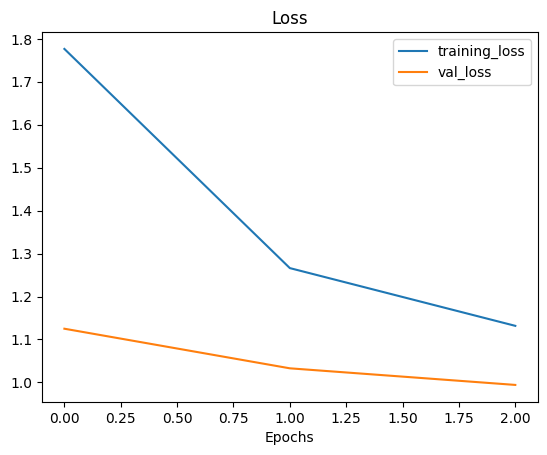

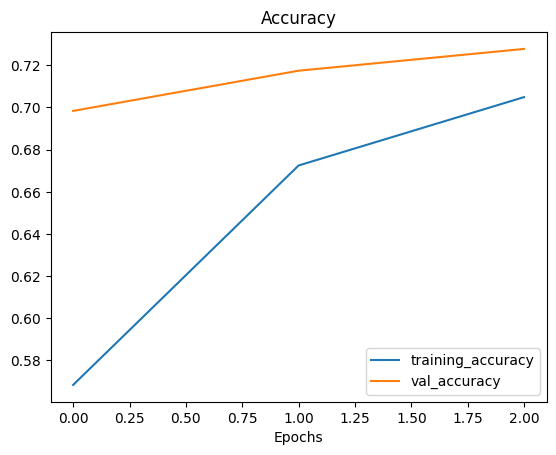

In [42]:
plot_loss_curves(history_feature_extraction)

## END OF TEMPLATE

We've covered a lot of ground so far since this is a milstone project, it's time for us to takeover.  

More specifically, our challemge is to complete the TEMPLATE version of this computer vision model.  


## Let's Start to Experiment again

### Save and Load

In [43]:
feature_model_path = MODEL_DIR + "/efficientnetb0_feature_model_mixed_precision.keras"

model.save(feature_model_path)

In [44]:
!ls

drive  helper_functions.py  __pycache__  sample_data


In [45]:
!ls $MODEL_DIR

efficientnetb0_feature_model_mixed_precision.keras


In [46]:
loaded_model = tf.keras.models.load_model(feature_model_path)

In [47]:
loaded_model.evaluate(test_data)

790/790 ━━━━━━━━━━━━━━━━━━━━ 86s 76ms/step - accuracy: 0.7291 - loss: 0.9942


[0.9942341446876526, 0.7291089296340942]

In [48]:
loaded_model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetb0 (Functional)     │ (None, 7, 7, 1280)     │     4,049,571 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 101)            │       129,381 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ softmax_float32 (Activation)    │ (None, 101)            │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,437,720 (16.93 MB)

 Trainable params: 129,381 (505.39 KB)

 Non-trainable params: 4,049,571 (15.45 MB)

 Optimizer params: 258,768 (1010.82 KB)

In [49]:
for i, layer in enumerate(loaded_model.layers):
    print(i, layer.name, layer.trainable, layer.dtype_policy)

0 input_layer_1 True <DTypePolicy "mixed_float16">
1 efficientnetb0 False <DTypePolicy "mixed_float16">
2 global_average_pooling2d True <DTypePolicy "mixed_float16">
3 dense True <DTypePolicy "mixed_float16">
4 softmax_float32 True <DTypePolicy "float32">


### Unfreeze base model  

In this milestone project, we unfreeze all layers of the EfficientNetB0 base model.

We are training on the full Food101 dataset, which is much larger than our previous small experiments.  

With more training data and a lower learning rate, the model can fine-tune its pretrained ImageNet features more safely and adapt them better to the 101 food classes.


In [50]:
loaded_model.layers[1].trainable = True

In [51]:
for layer in loaded_model.layers:
    print(layer.name, layer.trainable)

input_layer_1 True
efficientnetb0 True
global_average_pooling2d True
dense True
softmax_float32 True


In [52]:
for layer in loaded_model.layers[1].layers[:5]:
    print(layer.name, layer.trainable, layer.dtype, layer.dtype_policy)

input_layer True float32 <DTypePolicy "mixed_float16">
rescaling True float32 <DTypePolicy "mixed_float16">
normalization True float32 <DTypePolicy "mixed_float16">
rescaling_1 True float32 <DTypePolicy "mixed_float16">
stem_conv_pad True float32 <DTypePolicy "mixed_float16">


### Prepare Callback

In [53]:
# Setup EarlyStopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor="val_loss",
    patience=3 # it stops training if val_loss stops improving after 3 epochs
)

In [54]:
# Create TensorBoard callback
tensorboard_callback = create_tensorboard_callback(
    dir_name=LOG_DIR,
    experiment_name="efficientnetb0_food101_fine_tuning"
)

Saving TensorBoard log files to: /content/drive/MyDrive/food101_milestone/logs/efficientnetb0_food101_fine_tuning/20260529-173609


### Checkpoint callback

In [55]:
fine_tune_checkpoint_path = CHECKPOINT_DIR + "/fine_tune_best.weights.h5"

model_checkpoint_2 = tf.keras.callbacks.ModelCheckpoint(
    filepath=fine_tune_checkpoint_path,
    monitor="val_loss",
    save_best_only=True,
    save_weights_only=True,
    verbose=1
)

### Fine-tuning

In [56]:
loaded_model.compile(
    loss="sparse_categorical_crossentropy",
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),
    metrics=["accuracy"]
)

In [57]:
# Start fine-tuning

initial_epochs = 3
fine_tune_epochs = initial_epochs + 100

history_fine_tune = loaded_model.fit(
    train_data,
    epochs=fine_tune_epochs,
    steps_per_epoch=len(train_data),
    validation_data=test_data,
    validation_steps=int(0.15 * len(test_data)),
    initial_epoch=initial_epochs,
    callbacks=[
        tensorboard_callback,
        model_checkpoint_2,
        early_stopping
    ]
)

Epoch 4/103
2368/2368 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step - accuracy: 0.6297 - loss: 1.4562
Epoch 4: val_loss improved from None to 0.72613, saving model to /content/drive/MyDrive/food101_milestone/checkpoints/fine_tune_best.weights.h5

Epoch 4: finished saving model to /content/drive/MyDrive/food101_milestone/checkpoints/fine_tune_best.weights.h5
2368/2368 ━━━━━━━━━━━━━━━━━━━━ 599s 164ms/step - accuracy: 0.6957 - loss: 1.1637 - val_accuracy: 0.8027 - val_loss: 0.7261
Epoch 5/103
2367/2368 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - accuracy: 0.8024 - loss: 0.7461
Epoch 5: val_loss improved from 0.72613 to 0.65919, saving model to /content/drive/MyDrive/food101_milestone/checkpoints/fine_tune_best.weights.h5

Epoch 5: finished saving model to /content/drive/MyDrive/food101_milestone/checkpoints/fine_tune_best.weights.h5
2368/2368 ━━━━━━━━━━━━━━━━━━━━ 228s 95ms/step - accuracy: 0.8042 - loss: 0.7290 - val_accuracy: 0.8138 - val_loss: 0.6592
Epoch 6/103
2367/2368 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step

In [58]:
# Load best weights from checkpoint
loaded_model.load_weights(fine_tune_checkpoint_path)

# Evaluate fine-tuned model on the whole test dataset
results_fine_tuned_model = loaded_model.evaluate(test_data)
results_fine_tuned_model

790/790 ━━━━━━━━━━━━━━━━━━━━ 70s 89ms/step - accuracy: 0.8242 - loss: 0.6335


[0.6335098743438721, 0.8241980075836182]

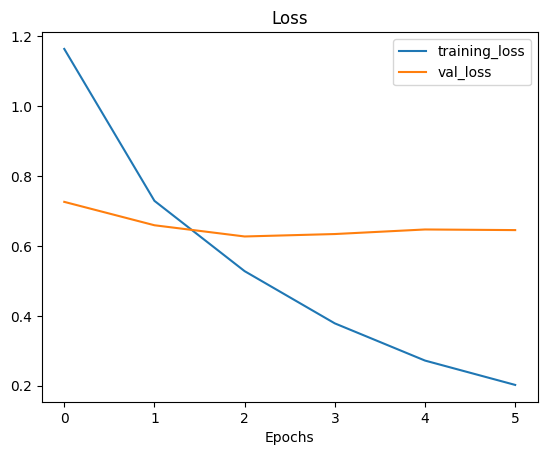

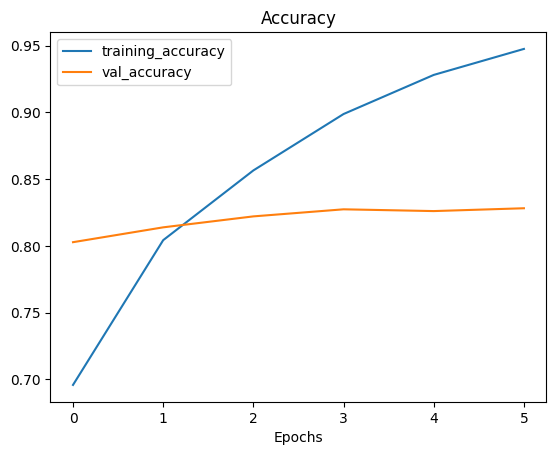

In [59]:
plot_loss_curves(history_fine_tune)

After fine-tuning all layers of the EfficientNetB0 base model, the model improved from about 72.8% accuracy to about 82.1% accuracy on the full test dataset.  

The training curves show that the training accuracy kept increasing while the validation accuracy started to plateau around 82%, which suggests that the model began to slightly overfit after a few fine-tuning epochs.  

However, the ModelCheckpoint callback saved the best weights based on validation loss, so we restored the best-performing version before evaluating on the full test dataset.

In [60]:
loaded_model.save(MODEL_DIR + "/efficientnetb0_food101_fine_tuned_model.keras")

### TensorBoard

In [61]:
%load_ext tensorboard
%tensorboard --logdir /content/drive/MyDrive/food101_milestone/logs

<IPython.core.display.Javascript object>

### Evaluation

In [62]:
# Get predictions and true labels in the same loop to keep their order aligned
import numpy as np
y_labels = []
pred_probs_list = []

for images, labels in test_data:
    batch_pred_probs = loaded_model.predict(images, verbose=0)

    pred_probs_list.append(batch_pred_probs)
    y_labels.append(labels.numpy())

pred_probs = np.concatenate(pred_probs_list, axis=0)
y_labels = np.concatenate(y_labels, axis=0)

pred_classes = pred_probs.argmax(axis=1)

print("pred_probs shape:", pred_probs.shape)
print("pred_classes shape:", pred_classes.shape)
print("y_labels shape:", y_labels.shape)

pred_probs shape: (25250, 101)
pred_classes shape: (25250,)
y_labels shape: (25250,)


In [63]:
len(pred_classes), len(y_labels)

(25250, 25250)

In [64]:
from helper_functions import calculate_results

fine_tuned_results = calculate_results(
    y_true=y_labels,
    y_pred=pred_classes
)

fine_tuned_results

{'accuracy': 82.41980198019802,
 'precision': 0.8247871236038715,
 'recall': 0.8241980198019802,
 'f1': 0.8232342417943075}

In [66]:
import pandas as pd
pd.DataFrame([fine_tuned_results], index=["fine_tuned_model"])

,accuracy,precision,recall,f1
fine_tuned_model,82.419802,0.824787,0.824198,0.823234


In [67]:
from sklearn.metrics import classification_report
classification_report_dict = classification_report(
    y_labels,
    pred_classes,
    target_names=class_names,
    output_dict=True
)

class_f1_scores = {}

for k, v in classification_report_dict.items():
    if k in class_names:
        class_f1_scores[k] = v["f1-score"]

f1_scores_df = pd.DataFrame({
    "class_name": list(class_f1_scores.keys()),
    "f1_score": list(class_f1_scores.values())
}).sort_values("f1_score", ascending=True)

f1_scores_df.head(10)

,class_name,f1_score
93,steak,0.578475
77,pork_chop,0.619154
0,apple_pie,0.626667
39,foie_gras,0.627002
22,chocolate_mousse,0.637275
8,bread_pudding,0.648649
15,ceviche,0.668113
56,huevos_rancheros,0.686456
99,tuna_tartare,0.687873
5,beet_salad,0.695312


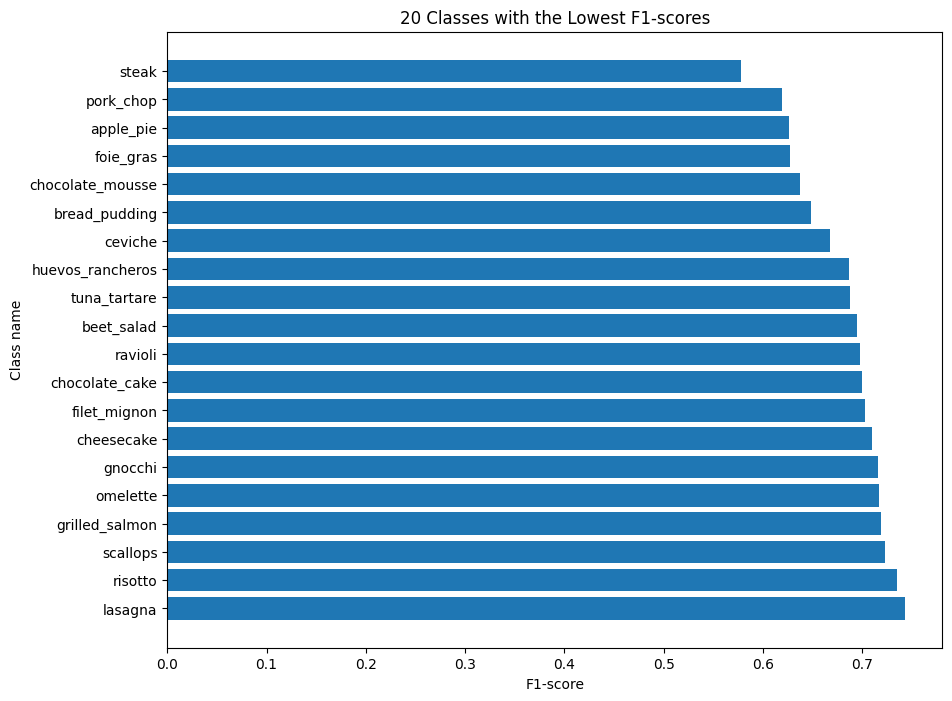

In [68]:
plt.figure(figsize=(10, 8))
plt.barh(f1_scores_df["class_name"][:20], f1_scores_df["f1_score"][:20])
plt.xlabel("F1-score")
plt.ylabel("Class name")
plt.title("20 Classes with the Lowest F1-scores")
plt.gca().invert_yaxis()
plt.show()

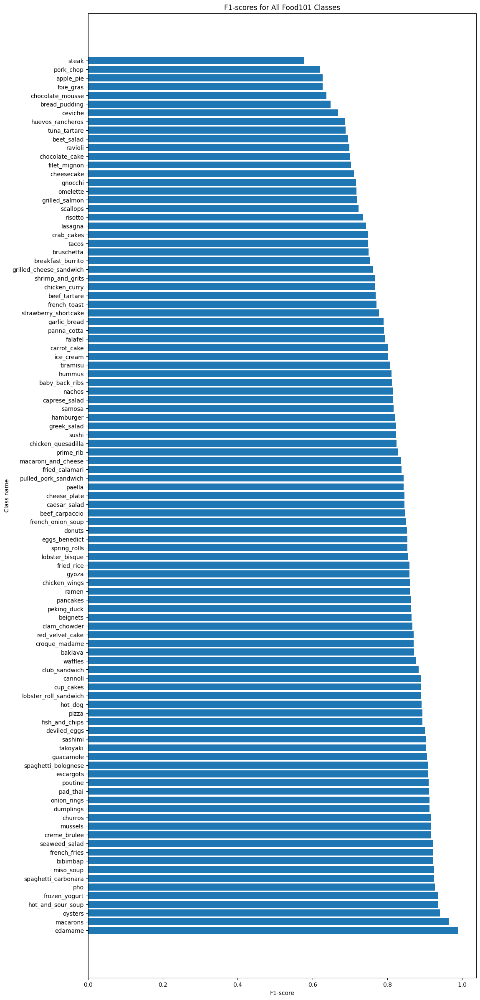

In [69]:
plt.figure(figsize=(12, 30))
plt.barh(f1_scores_df["class_name"], f1_scores_df["f1_score"])
plt.xlabel("F1-score")
plt.ylabel("Class name")
plt.title("F1-scores for All Food101 Classes")
plt.gca().invert_yaxis()
plt.show()

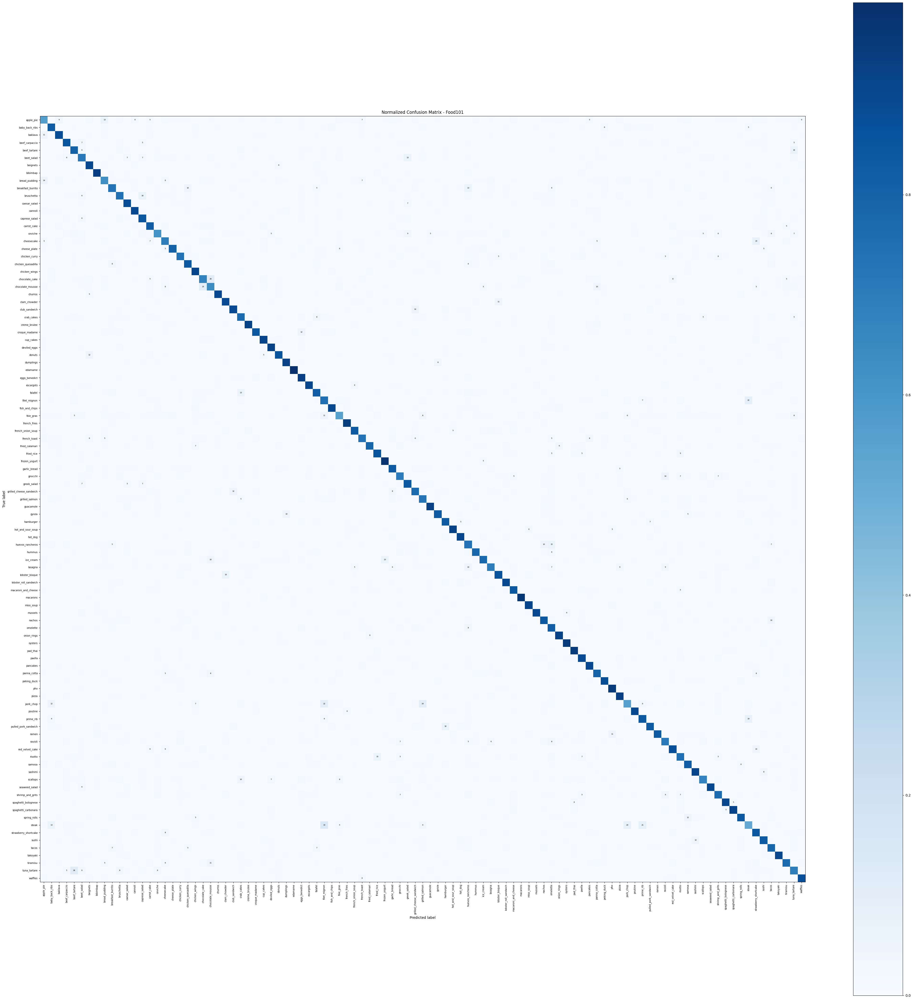

In [70]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import numpy as np

cm = confusion_matrix(y_labels, pred_classes)
cm_norm = cm.astype("float") / cm.sum(axis=1)[:, np.newaxis]

plt.figure(figsize=(40, 40))
plt.imshow(cm_norm, interpolation="nearest", cmap="Blues")
plt.title("Normalized Confusion Matrix - Food101")
plt.colorbar()

tick_marks = np.arange(len(class_names))
plt.xticks(tick_marks, class_names, rotation=90, fontsize=7)
plt.yticks(tick_marks, class_names, fontsize=7)

plt.xlabel("Predicted label")
plt.ylabel("True label")

min_wrong_count = 5
threshold = cm_norm.max() / 2

for i in range(cm.shape[0]):
    for j in range(cm.shape[1]):
        if i != j and cm[i, j] >= min_wrong_count:
            plt.text(
                j, i,
                str(cm[i, j]),
                ha="center",
                va="center",
                fontsize=5,
                color="white" if cm_norm[i, j] > threshold else "black"
            )

plt.tight_layout()
plt.savefig(
    PROJECT_DIR + "/food101_normalized_confusion_matrix_major_wrong_counts.png",
    dpi=300,
    bbox_inches="tight"
)
plt.show()

In [71]:
# Get prediction confidence scores
pred_confidences = pred_probs.max(axis=1)

pred_confidences[:10]

array([0.50383186, 0.9574892 , 0.8294173 , 0.99999774, 0.988947  ,
       0.356674  , 0.9999875 , 0.99754995, 0.9992444 , 0.3122311 ],
      dtype=float32)

In [72]:
pred_df = pd.DataFrame({
    "y_true": y_labels,
    "y_pred": pred_classes,
    "pred_conf": pred_confidences
})

pred_df.head()

,y_true,y_pred,pred_conf
0,15,22,0.503832
1,49,49,0.957489
2,12,12,0.829417
3,7,7,0.999998
4,33,33,0.988947


In [73]:
pred_df["true_class"] = pred_df["y_true"].apply(lambda x: class_names[x])
pred_df["pred_class"] = pred_df["y_pred"].apply(lambda x: class_names[x])

pred_df.head()

,y_true,y_pred,pred_conf,true_class,pred_class
0,15,22,0.503832,ceviche,chocolate_mousse
1,49,49,0.957489,grilled_cheese_sandwich,grilled_cheese_sandwich
2,12,12,0.829417,cannoli,cannoli
3,7,7,0.999998,bibimbap,bibimbap
4,33,33,0.988947,edamame,edamame


In [74]:
pred_df["correct"] = pred_df["y_true"] == pred_df["y_pred"]

pred_df.head()

,y_true,y_pred,pred_conf,true_class,pred_class,correct
0,15,22,0.503832,ceviche,chocolate_mousse,False
1,49,49,0.957489,grilled_cheese_sandwich,grilled_cheese_sandwich,True
2,12,12,0.829417,cannoli,cannoli,True
3,7,7,0.999998,bibimbap,bibimbap,True
4,33,33,0.988947,edamame,edamame,True


In [75]:
wrong_preds_df = pred_df[pred_df["correct"] == False].sort_values(
    "pred_conf",
    ascending=False
)

wrong_preds_df.head(10)

,y_true,y_pred,pred_conf,true_class,pred_class,correct
1162,72,67,0.999966,pancakes,omelette,False
13997,46,10,0.999882,garlic_bread,bruschetta,False
16210,65,69,0.999816,mussels,oysters,False
981,14,29,0.999529,carrot_cake,cup_cakes,False
6519,93,1,0.999125,steak,baby_back_ribs,False
3059,14,67,0.998515,carrot_cake,omelette,False
4004,0,31,0.998471,apple_pie,donuts,False
9816,87,30,0.998349,scallops,deviled_eggs,False
9634,79,1,0.998282,prime_rib,baby_back_ribs,False
778,5,11,0.998174,beet_salad,caesar_salad,False


To better understand model errors, I created a dataframe containing the true label, predicted label, prediction confidence, and whether the prediction was correct. Then I sorted the wrong predictions by confidence to find the examples where the model was most confident but still incorrect.

## Runtime Restart Note

The Colab runtime restarted because I tried to store all Food101 test images in RAM. Since the test set is large, this caused a memory issue.

Luckily, the model and checkpoints were saved to Google Drive, so the training progress was not lost. For evaluation, I will only store prediction probabilities and true labels, and load images only when needed for visualization.


In [3]:
from google.colab import drive
drive.mount("/content/drive")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [4]:
!ls /content/drive/MyDrive/food101_milestone/models
!ls /content/drive/MyDrive/food101_milestone/checkpoints

efficientnetb0_feature_model_mixed_precision.keras
efficientnetb0_food101_fine_tuned_model.keras
feature_extract_best.weights.h5  fine_tune_best.weights.h5


In [5]:
import tensorflow as tf
import tensorflow_datasets as tfds
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

loaded_model = tf.keras.models.load_model(
    "/content/drive/MyDrive/food101_milestone/models/efficientnetb0_food101_fine_tuned_model.keras"
)

/usr/local/lib/python3.12/dist-packages/keras/src/saving/saving_lib.py:797: UserWarning: Skipping variable loading for optimizer 'adam', because it has 428 variables whereas the saved optimizer has 432 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


In [6]:
(test_data,), ds_info = tfds.load(
    name="food101",
    split=["validation"],
    shuffle_files=False,
    as_supervised=True,
    with_info=True
)

class_names = ds_info.features["label"].names

def preprocessing_img(image, label, img_shape=224):
    image = tf.image.resize(image, [img_shape, img_shape])
    return tf.cast(image, tf.float32), label

test_data = test_data.map(
    map_func=preprocessing_img,
    num_parallel_calls=tf.data.AUTOTUNE
).batch(32)

In [7]:
loaded_model.evaluate(test_data)

790/790 ━━━━━━━━━━━━━━━━━━━━ 156s 111ms/step - accuracy: 0.8242 - loss: 0.6335


[0.633507490158081, 0.8242376446723938]

### 1. Collecting prediction probabilities and true labels

In this step, I collect the model's prediction probabilities and the true labels from the test dataset.

I do not store the test images here because Food101 has a large test set. Storing all images in RAM can cause memory issues in Colab.

Instead, I only keep:

pred_probs: model prediction probabilities
y_labels: true labels
pred_classes: predicted class indices

This is enough for metrics such as accuracy, precision, recall, F1-score, and confusion matrix.

In [8]:
y_labels = []
pred_probs_list = []

for images, labels in test_data:
    batch_pred_probs = loaded_model.predict(images, verbose=0)

    pred_probs_list.append(batch_pred_probs)
    y_labels.append(labels.numpy())

pred_probs = np.concatenate(pred_probs_list, axis=0)
y_labels = np.concatenate(y_labels, axis=0)

pred_classes = pred_probs.argmax(axis=1)

print("pred_probs shape:", pred_probs.shape)
print("pred_classes shape:", pred_classes.shape)
print("y_labels shape:", y_labels.shape)

pred_probs shape: (25250, 101)
pred_classes shape: (25250,)
y_labels shape: (25250,)


### 2. Creating the prediction dataframe

In this step, I create a dataframe to organize the model's predictions.

The dataframe contains:

* the true label index
* the predicted label index
* the prediction confidence score
* the true class name
* the predicted class name
* whether the prediction was correct

This makes it easier to analyze model performance and find wrong predictions.


In [9]:
pred_confidences = pred_probs.max(axis=1)

pred_df = pd.DataFrame({
    "y_true": y_labels,
    "y_pred": pred_classes,
    "pred_conf": pred_confidences
})

pred_df["true_class"] = pred_df["y_true"].apply(lambda x: class_names[x])
pred_df["pred_class"] = pred_df["y_pred"].apply(lambda x: class_names[x])
pred_df["correct"] = pred_df["y_true"] == pred_df["y_pred"]

wrong_preds_df = pred_df[pred_df["correct"] == False].sort_values(
    "pred_conf",
    ascending=False
)

wrong_preds_df.head(10)

,y_true,y_pred,pred_conf,true_class,pred_class,correct
1113,72,67,0.999966,pancakes,omelette,False
13884,46,10,0.999882,garlic_bread,bruschetta,False
16129,65,69,0.999816,mussels,oysters,False
900,14,29,0.999525,carrot_cake,cup_cakes,False
6614,93,1,0.999127,steak,baby_back_ribs,False
3010,14,67,0.998503,carrot_cake,omelette,False
3891,0,31,0.998468,apple_pie,donuts,False
9735,87,30,0.998342,scallops,deviled_eggs,False
9521,79,1,0.998275,prime_rib,baby_back_ribs,False
810,5,11,0.998176,beet_salad,caesar_salad,False


### 3. Getting only selected images by index

This function retrieves only the images that I want to visualize.

Instead of loading the entire Food101 test image set into RAM, it loops through the dataset and collects only the selected image indices.

This is a memory-safe approach for large image datasets.

In [10]:
def get_images_by_indices(dataset, indices):
    """
    Gets only selected images from a tf.data.Dataset without loading
    the whole test dataset into RAM.
    """
    indices_set = set(indices)
    selected_images = {}

    for idx, (image, label) in enumerate(dataset.unbatch()):
        if idx in indices_set:
            selected_images[idx] = image.numpy().astype("uint8")

        if len(selected_images) == len(indices_set):
            break

    return selected_images

### 4. Plotting random predictions safely

This function plots random prediction examples from the test dataset.

It shows:

- actual class
- predicted class
- softmax confidence score

Correct predictions are shown in green, and wrong predictions are shown in red.

The function does not require storing all test images in memory. It only loads the selected images needed for visualization.

In [13]:
def plot_random_predictions_from_dataset(pred_df, dataset, n=9, only_wrong=False):
    """
    Plot random predictions without storing all test images in RAM.

    Shows:
    - actual class
    - predicted class
    - softmax confidence score
    """
    if only_wrong:
        sample_df = pred_df[pred_df["correct"] == False].sample(n=n)
    else:
        sample_df = pred_df.sample(n=n)

    selected_indices = sample_df.index.tolist()
    selected_images = get_images_by_indices(dataset, selected_indices)

    cols = 3
    rows = int(np.ceil(n / cols))

    plt.figure(figsize=(15, rows * 5))

    for i, row in enumerate(sample_df.itertuples()):
        image_index = row.Index

        plt.subplot(rows, cols, i + 1)
        plt.imshow(selected_images[image_index])
        plt.axis(False)

        title_color = "green" if row.correct else "red"

        plt.title(
            f"Actual: {row.true_class}\n"
            f"Pred: {row.pred_class}\n"
            f"Softmax: {row.pred_conf:.3f}",
            color=title_color,
            fontsize=10
        )

    plt.tight_layout()
    plt.show()

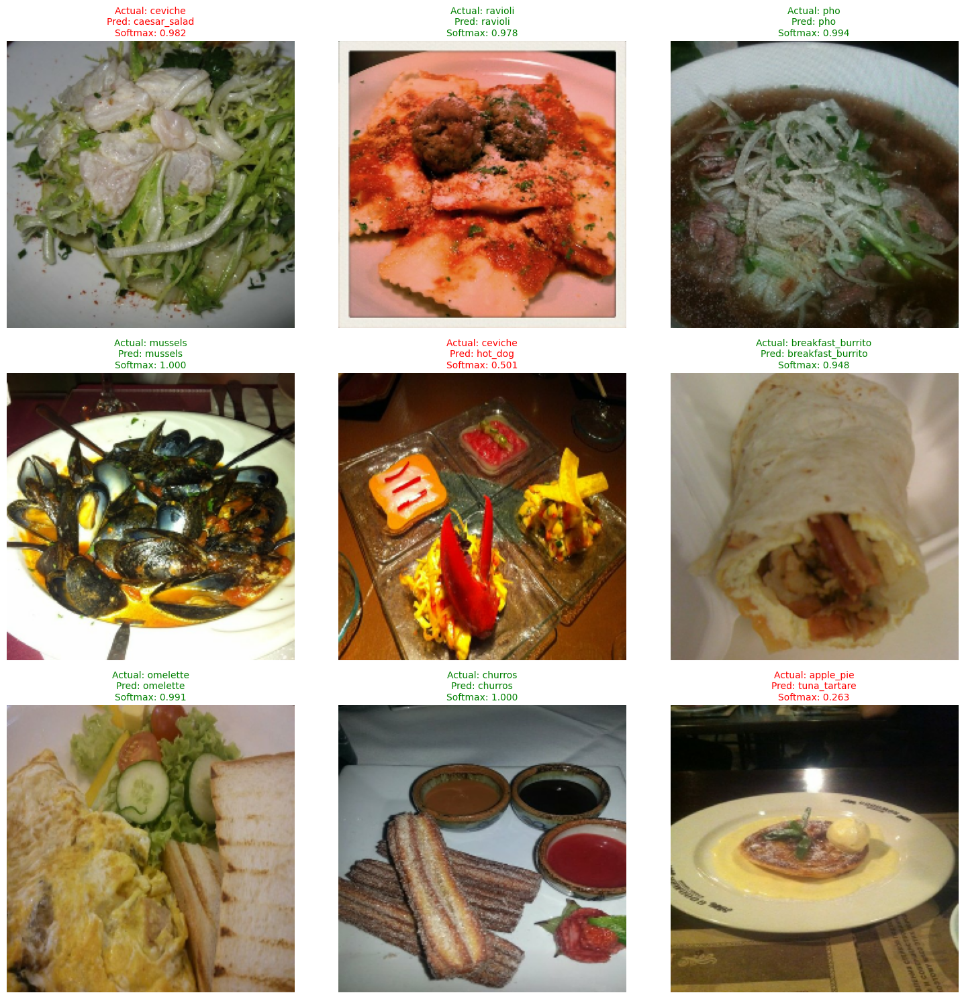

In [14]:
plot_random_predictions_from_dataset(
    pred_df=pred_df,
    dataset=test_data,
    n=9,
    only_wrong=False
)

### 5. Plotting the most confident wrong predictions

This function visualizes the wrong predictions with the highest confidence scores.

These are the cases where the model was most confident but still made a mistake.

This is useful for understanding which food classes the model confuses and what types of images are difficult for the model.

In [15]:
def plot_most_wrong_predictions_from_dataset(wrong_preds_df, dataset, n=9, start_index=0):
    """
    Plot the most confident wrong predictions without loading all test images into RAM.
    """
    images_to_view = wrong_preds_df.iloc[start_index:start_index+n]
    selected_indices = images_to_view.index.tolist()
    selected_images = get_images_by_indices(dataset, selected_indices)

    cols = 3
    rows = int(np.ceil(n / cols))

    plt.figure(figsize=(15, rows * 5))

    for i, row in enumerate(images_to_view.itertuples()):
        image_index = row.Index

        plt.subplot(rows, cols, i + 1)
        plt.imshow(selected_images[image_index])
        plt.axis(False)

        plt.title(
            f"Actual: {row.true_class}\n"
            f"Pred: {row.pred_class}\n"
            f"Softmax: {row.pred_conf:.3f}",
            color="red",
            fontsize=10
        )

    plt.tight_layout()
    plt.show()

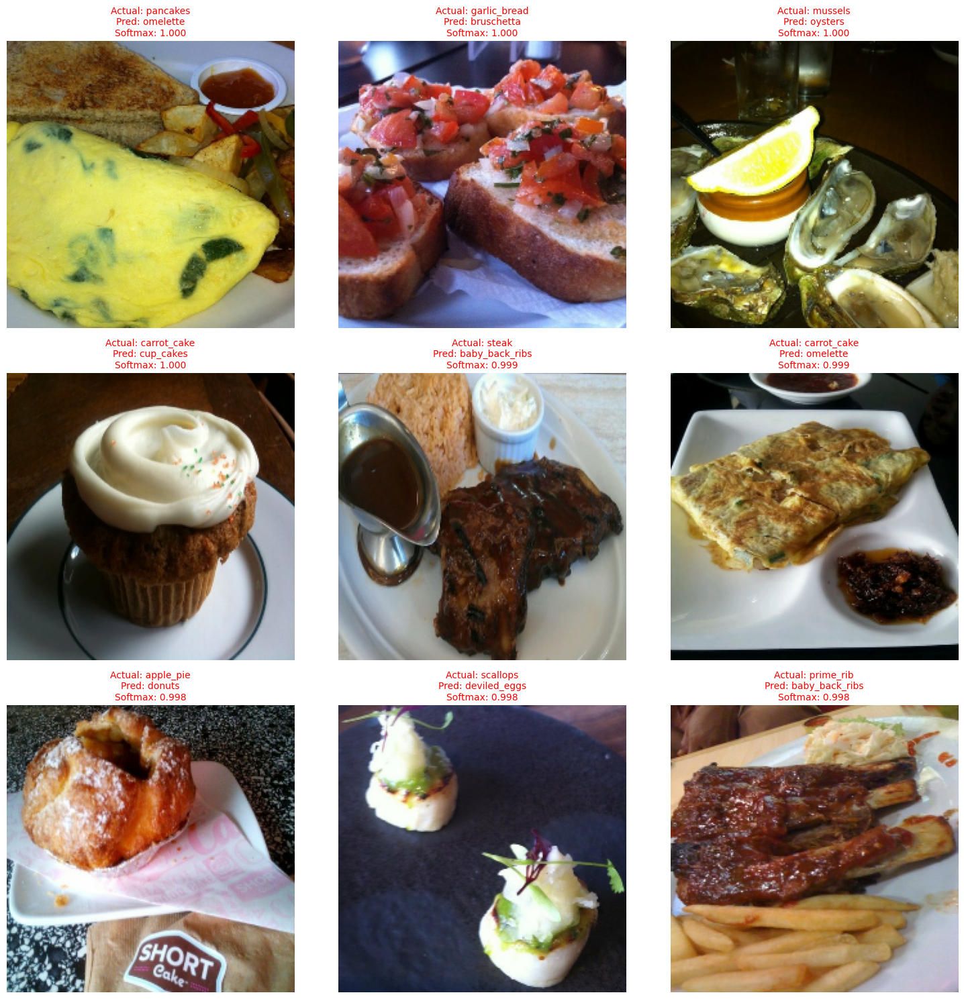

In [16]:
plot_most_wrong_predictions_from_dataset(
    wrong_preds_df=wrong_preds_df,
    dataset=test_data,
    n=9,
    start_index=0
)

### 6. Random predictions with top-5 probabilities

This function randomly selects 3 images from the test dataset and shows the model's top 5 softmax probabilities for each image.

It is memory-safe because it does not store all test images in RAM. Instead, it only loads the selected images by index.

In [17]:
def plot_random_predictions_with_top_5(pred_df, pred_probs, dataset, class_names, n=3, top_k=5):
    """
    Plot random test images with actual class, predicted class,
    prediction confidence, and top-k softmax probabilities.

    This function does not load all test images into RAM.
    It only loads the selected images by index.
    """
    sample_df = pred_df.sample(n=n)

    selected_indices = sample_df.index.tolist()
    selected_images = get_images_by_indices(dataset, selected_indices)

    plt.figure(figsize=(16, n * 4))

    for idx, row in enumerate(sample_df.itertuples()):
        image_index = row.Index

        # Get top-k prediction indices
        top_indices = pred_probs[image_index].argsort()[-top_k:][::-1]

        top_text = "\n".join([
            f"{class_names[i]}: {pred_probs[image_index][i]:.3f}"
            for i in top_indices
        ])

        # Plot image
        plt.subplot(n, 2, idx * 2 + 1)
        plt.imshow(selected_images[image_index])
        plt.axis(False)

        title_color = "green" if row.correct else "red"

        plt.title(
            f"Actual: {row.true_class}\n"
            f"Pred: {row.pred_class}\n"
            f"Softmax: {row.pred_conf:.3f}",
            color=title_color,
            fontsize=11
        )

        # Plot top-5 text
        plt.subplot(n, 2, idx * 2 + 2)
        plt.axis(False)
        plt.text(
            0.05,
            0.5,
            top_text,
            fontsize=12,
            va="center"
        )
        plt.title("Top 5 Predictions", fontsize=12)

    plt.tight_layout()
    plt.show()

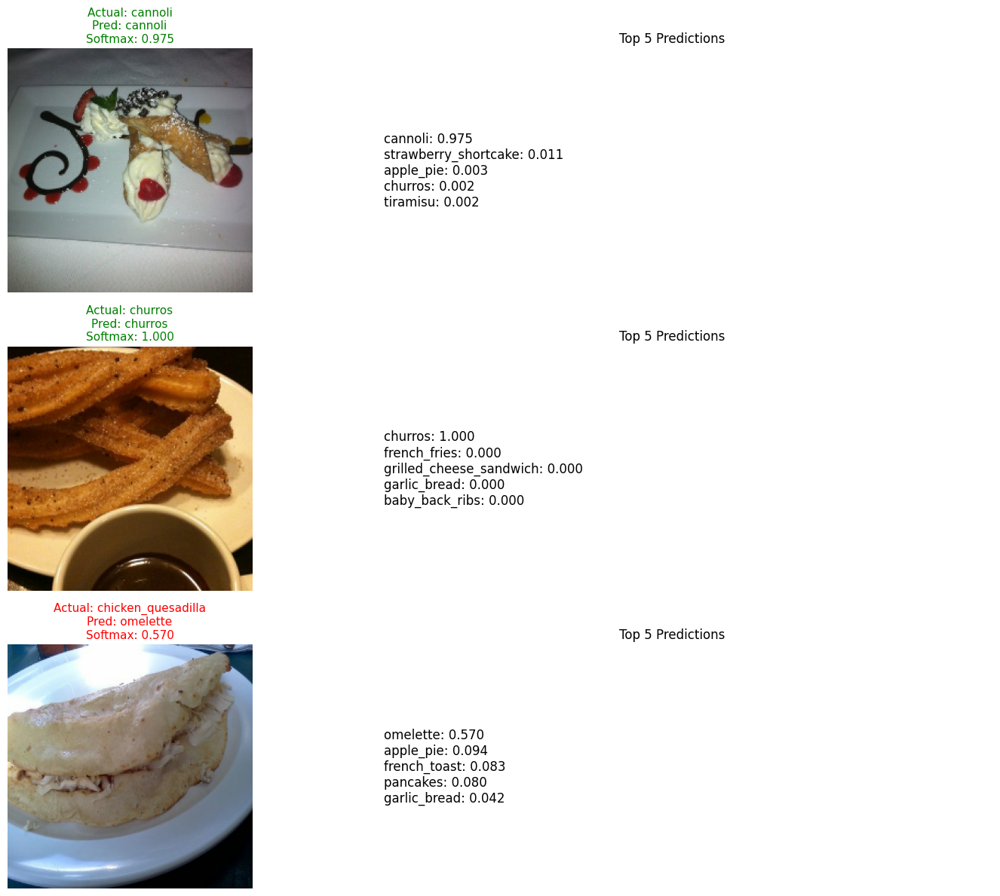

In [18]:
plot_random_predictions_with_top_5(
    pred_df=pred_df,
    pred_probs=pred_probs,
    dataset=test_data,
    class_names=class_names,
    n=3,
    top_k=5
)

### 7. prediction with custom images

In [19]:
!wget -O image_1.jpg "https://www.kikkoman.com.tr/fileadmin/_processed_/9/0/csm_1414_Vegan_Tempura_Sushi_Desktop_Header_838add7854.jpg"
!wget -O image_2.jpg "https://cdn.tasteatlas.com/images/recipes/105a4e88dca44f4a81dbaf6ccb7b83bc.jpg"
!wget -O image_3.jpg "https://www.rainbownourishments.com/wp-content/uploads/2025/02/small-batch-vegan-strawberry-cake-1.1.jpg"

--2026-05-29 18:46:42--  https://www.kikkoman.com.tr/fileadmin/_processed_/9/0/csm_1414_Vegan_Tempura_Sushi_Desktop_Header_838add7854.jpg
Resolving www.kikkoman.com.tr (www.kikkoman.com.tr)... 45.60.62.62
Connecting to www.kikkoman.com.tr (www.kikkoman.com.tr)|45.60.62.62|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 231333 (226K) [image/jpeg]
Saving to: ‘image_1.jpg’

image_1.jpg         100%[===================>] 225.91K  --.-KB/s    in 0.03s   

2026-05-29 18:46:42 (8.33 MB/s) - ‘image_1.jpg’ saved [231333/231333]

--2026-05-29 18:46:42--  https://cdn.tasteatlas.com/images/recipes/105a4e88dca44f4a81dbaf6ccb7b83bc.jpg
Resolving cdn.tasteatlas.com (cdn.tasteatlas.com)... 104.17.37.105, 104.17.36.105, 2606:4700::6811:2569, ...
Connecting to cdn.tasteatlas.com (cdn.tasteatlas.com)|104.17.37.105|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [image/jpeg]
Saving to: ‘image_2.jpg’

image_2.jpg             [ <=>             

This function tests the fine-tuned Food101 model on custom images downloaded from the internet.

Each image is loaded, resized to `224x224`, converted into a tensor, and passed into the model.  
The function displays the predicted class, confidence score, and the top 5 softmax probabilities for each custom image.

In [20]:
def pred_and_plot_custom_images(model, image_paths, class_names, img_shape=224, top_k=5):
    """
    Predicts custom images and plots each image with its top-k predictions.

    This function is for images outside the test dataset.
    It loads each image from a file path, resizes it to 224x224,
    makes a prediction, and shows the top-k softmax probabilities.
    """
    plt.figure(figsize=(16, len(image_paths) * 4))

    for idx, image_path in enumerate(image_paths):
        # Load image
        img = tf.keras.utils.load_img(
            image_path,
            target_size=(img_shape, img_shape)
        )

        # Convert image to array
        img_array = tf.keras.utils.img_to_array(img)

        # Expand dimensions for model: (224, 224, 3) -> (1, 224, 224, 3)
        img_expanded = tf.expand_dims(img_array, axis=0)

        # Predict
        pred_probs = model.predict(img_expanded, verbose=0)[0]

        # Get top-k predictions
        top_indices = pred_probs.argsort()[-top_k:][::-1]
        pred_index = top_indices[0]
        pred_class = class_names[pred_index]
        pred_conf = pred_probs[pred_index]

        top_text = "\n".join([
            f"{class_names[i]}: {pred_probs[i]:.3f}"
            for i in top_indices
        ])

        # Plot image
        plt.subplot(len(image_paths), 2, idx * 2 + 1)
        plt.imshow(img_array.astype("uint8"))
        plt.axis(False)
        plt.title(
            f"Prediction: {pred_class}\nConfidence: {pred_conf:.3f}",
            fontsize=12
        )

        # Plot top-k text
        plt.subplot(len(image_paths), 2, idx * 2 + 2)
        plt.axis(False)
        plt.text(
            0.05,
            0.5,
            top_text,
            fontsize=12,
            va="center"
        )
        plt.title(f"Top {top_k} Predictions", fontsize=12)

    plt.tight_layout()
    plt.show()

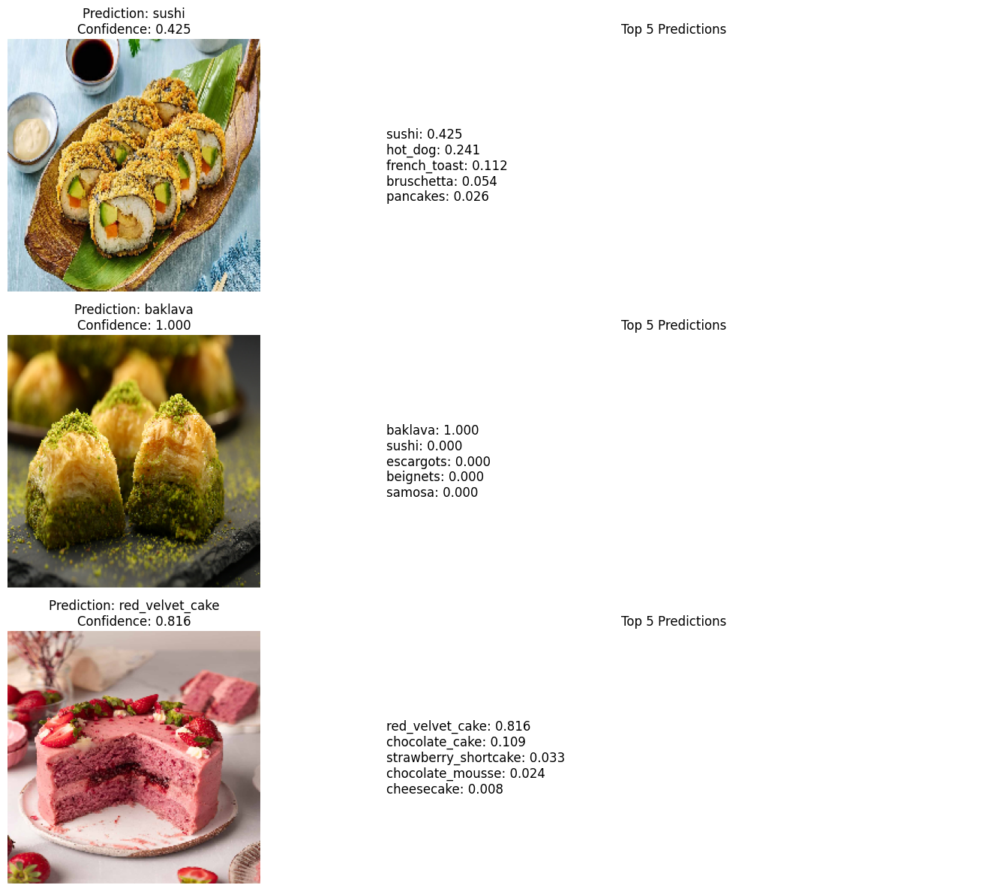

In [21]:
custom_image_paths = [
    "image_1.jpg",
    "image_2.jpg",
    "image_3.jpg"
]

pred_and_plot_custom_images(
    model=loaded_model,
    image_paths=custom_image_paths,
    class_names=class_names,
    img_shape=224,
    top_k=5
)